# Data Mining Project
## Medical Appointment No Show
### 171210005, 171210009, 171210030

In [5]:
import numpy as np
import pandas as pd
import math
from sklearn import tree
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit, RandomizedSearchCV, GridSearchCV

In [6]:
data = pd.read_csv('KaggleV2-May-2016.csv')

In [7]:
data.head()

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,No-show
0,2.987250e+13,5642903,F,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,0,1,0,0,0,0,No
1,5.589978e+14,5642503,M,2016-04-29T16:08:27Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,0,0,0,0,0,No
2,4.262962e+12,5642549,F,2016-04-29T16:19:04Z,2016-04-29T00:00:00Z,62,MATA DA PRAIA,0,0,0,0,0,0,No
3,8.679512e+11,5642828,F,2016-04-29T17:29:31Z,2016-04-29T00:00:00Z,8,PONTAL DE CAMBURI,0,0,0,0,0,0,No
4,8.841186e+12,5642494,F,2016-04-29T16:07:23Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,1,1,0,0,0,No


In [8]:
(data['Gender']=="F").value_counts()

True     71840
False    38687
Name: Gender, dtype: int64

In [9]:
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
data['No-show'] = label_encoder.fit_transform(data['No-show'])
data['No-show'].unique()
df = pd.DataFrame(data)
df['ScheduledDay']

0         2016-04-29T18:38:08Z
1         2016-04-29T16:08:27Z
2         2016-04-29T16:19:04Z
3         2016-04-29T17:29:31Z
4         2016-04-29T16:07:23Z
                  ...         
110522    2016-05-03T09:15:35Z
110523    2016-05-03T07:27:33Z
110524    2016-04-27T16:03:52Z
110525    2016-04-27T15:09:23Z
110526    2016-04-27T13:30:56Z
Name: ScheduledDay, Length: 110527, dtype: object

In [10]:
df = pd.DataFrame(data)
df['ScheduledDay'] = pd.to_datetime(df['ScheduledDay']).dt.date.astype('datetime64[ns]')
df['AppointmentDay'] = pd.to_datetime(df['AppointmentDay']).dt.date.astype('datetime64[ns]')

df['WaitingTime'] = (df.AppointmentDay - df.ScheduledDay).dt.days # and convert timedelta to int

# Check if the column exists
df['WaitingTime']
df.drop(['AppointmentID','Neighbourhood','Scholarship'], axis = 1) 

,PatientId,Gender,ScheduledDay,AppointmentDay,Age,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,No-show,WaitingTime
0,2.987250e+13,F,2016-04-29,2016-04-29,62,1,0,0,0,0,0,0
1,5.589978e+14,M,2016-04-29,2016-04-29,56,0,0,0,0,0,0,0
2,4.262962e+12,F,2016-04-29,2016-04-29,62,0,0,0,0,0,0,0
3,8.679512e+11,F,2016-04-29,2016-04-29,8,0,0,0,0,0,0,0
4,8.841186e+12,F,2016-04-29,2016-04-29,56,1,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
110522,2.572134e+12,F,2016-05-03,2016-06-07,56,0,0,0,0,1,0,35
110523,3.596266e+12,F,2016-05-03,2016-06-07,51,0,0,0,0,1,0,35
110524,1.557663e+13,F,2016-04-27,2016-06-07,21,0,0,0,0,1,0,41
110525,9.213493e+13,F,2016-04-27,2016-06-07,38,0,0,0,0,1,0,41


In [11]:
data['AppointmentDay']

0        2016-04-29
1        2016-04-29
2        2016-04-29
3        2016-04-29
4        2016-04-29
            ...    
110522   2016-06-07
110523   2016-06-07
110524   2016-06-07
110525   2016-06-07
110526   2016-06-07
Name: AppointmentDay, Length: 110527, dtype: datetime64[ns]

In [12]:
date_col=[]

In [13]:
for column in df[['AppointmentDay']]:
   # Select column contents by column name using [] operator
   res = df[column]
   print(res.values)

#for i in range(len(res)):
 #   idx = pd.date_range(start=res[i],freq='D',periods=1)
  #  val = idx.day_name()
   # date_col.append(val[0])

for column in df[['ScheduledDay']]:
    #Select column contents by column name using [] operator
   res = df[column]
   print(res.values)

for i in range(len(res)):
    idx = pd.date_range(start=res[i],freq='D',periods=1)
    val = idx.day_name()
    date_col.append(val[0])

print(date_col)

['2016-04-29T00:00:00.000000000' '2016-04-29T00:00:00.000000000'
 '2016-04-29T00:00:00.000000000' ... '2016-06-07T00:00:00.000000000'
 '2016-06-07T00:00:00.000000000' '2016-06-07T00:00:00.000000000']
['2016-04-29T00:00:00.000000000' '2016-04-29T00:00:00.000000000'
 '2016-04-29T00:00:00.000000000' ... '2016-04-27T00:00:00.000000000'
 '2016-04-27T00:00:00.000000000' '2016-04-27T00:00:00.000000000']
['Friday', 'Friday', 'Friday', 'Friday', 'Friday', 'Wednesday', 'Wednesday', 'Wednesday', 'Friday', 'Wednesday', 'Wednesday', 'Tuesday', 'Thursday', 'Thursday', 'Thursday', 'Tuesday', 'Thursday', 'Thursday', 'Tuesday', 'Friday', 'Wednesday', 'Wednesday', 'Monday', 'Thursday', 'Friday', 'Tuesday', 'Friday', 'Wednesday', 'Friday', 'Friday', 'Wednesday', 'Wednesday', 'Friday', 'Monday', 'Friday', 'Friday', 'Friday', 'Friday', 'Wednesday', 'Friday', 'Thursday', 'Thursday', 'Thursday', 'Friday', 'Thursday', 'Thursday', 'Monday', 'Thursday', 'Tuesday', 'Thursday', 'Thursday', 'Thursday', 'Thursday',

In [14]:
data

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,No-show,WaitingTime
0,2.987250e+13,5642903,F,2016-04-29,2016-04-29,62,JARDIM DA PENHA,0,1,0,0,0,0,0,0
1,5.589978e+14,5642503,M,2016-04-29,2016-04-29,56,JARDIM DA PENHA,0,0,0,0,0,0,0,0
2,4.262962e+12,5642549,F,2016-04-29,2016-04-29,62,MATA DA PRAIA,0,0,0,0,0,0,0,0
3,8.679512e+11,5642828,F,2016-04-29,2016-04-29,8,PONTAL DE CAMBURI,0,0,0,0,0,0,0,0
4,8.841186e+12,5642494,F,2016-04-29,2016-04-29,56,JARDIM DA PENHA,0,1,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110522,2.572134e+12,5651768,F,2016-05-03,2016-06-07,56,MARIA ORTIZ,0,0,0,0,0,1,0,35
110523,3.596266e+12,5650093,F,2016-05-03,2016-06-07,51,MARIA ORTIZ,0,0,0,0,0,1,0,35
110524,1.557663e+13,5630692,F,2016-04-27,2016-06-07,21,MARIA ORTIZ,0,0,0,0,0,1,0,41
110525,9.213493e+13,5630323,F,2016-04-27,2016-06-07,38,MARIA ORTIZ,0,0,0,0,0,1,0,41


In [15]:
data['PatientId'].value_counts()

8.221459e+14    88
9.963767e+10    84
2.688613e+13    70
3.353478e+13    65
2.584244e+11    62
                ..
1.222828e+13     1
6.821231e+11     1
7.163981e+14     1
9.798964e+14     1
2.724571e+11     1
Name: PatientId, Length: 62299, dtype: int64

In [16]:
data['AppointmentID'].value_counts()

5769215    1
5731652    1
5707080    1
5702986    1
5715276    1
          ..
5586290    1
5584243    1
5598584    1
5602682    1
5771266    1
Name: AppointmentID, Length: 110527, dtype: int64

In [17]:
data['AppointmentID'].is_unique

True

In [18]:
data['PatientId'].is_unique

False

In [21]:
data['Age'].value_counts()

 0      3539
 1      2273
 52     1746
 49     1652
 53     1651
        ... 
 115       5
 100       4
 102       2
 99        1
-1         1
Name: Age, Length: 104, dtype: int64

Text(0, 0.5, 'No Show')

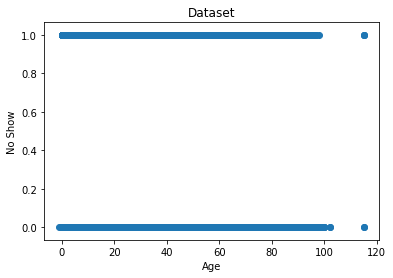

In [22]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots()

# scatter the sepal_length against the sepal_width
ax.scatter(data['Age'], data['No-show'])
# set a title and labels
ax.set_title('Dataset')
ax.set_xlabel('Age')
ax.set_ylabel('No Show')

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110527 entries, 0 to 110526
Data columns (total 15 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   PatientId       110527 non-null  float64       
 1   AppointmentID   110527 non-null  int64         
 2   Gender          110527 non-null  object        
 3   ScheduledDay    110527 non-null  datetime64[ns]
 4   AppointmentDay  110527 non-null  datetime64[ns]
 5   Age             110527 non-null  int64         
 6   Neighbourhood   110527 non-null  object        
 7   Scholarship     110527 non-null  int64         
 8   Hipertension    110527 non-null  int64         
 9   Diabetes        110527 non-null  int64         
 10  Alcoholism      110527 non-null  int64         
 11  Handcap         110527 non-null  int64         
 12  SMS_received    110527 non-null  int64         
 13  No-show         110527 non-null  int64         
 14  WaitingTime     110527 non-null  int

In [24]:
df['ScheduledDay'] = pd.to_datetime(df['ScheduledDay']).dt.date.astype('datetime64[ns]')
df['AppointmentDay'] = pd.to_datetime(df['AppointmentDay']).dt.date.astype('datetime64[ns]')

df['WaitingTime'] = (df.AppointmentDay - df.ScheduledDay).dt.days # and convert timedelta to int

# Check if the column exists
df['WaitingTime']

0          0
1          0
2          0
3          0
4          0
          ..
110522    35
110523    35
110524    41
110525    41
110526    41
Name: WaitingTime, Length: 110527, dtype: int64

In [25]:
df['AppointmentDayOfWeek'] = df.ScheduledDay.dt.weekday_name

# Check the values
df['AppointmentDayOfWeek'].value_counts()

AttributeError: 'DatetimeProperties' object has no attribute 'weekday_name'

In [26]:
print(df.rename(columns={"No-show": "No_Show"}))
print(df.describe())

           PatientId  AppointmentID Gender ScheduledDay AppointmentDay  Age  \
0       2.987250e+13        5642903      F   2016-04-29     2016-04-29   62   
1       5.589978e+14        5642503      M   2016-04-29     2016-04-29   56   
2       4.262962e+12        5642549      F   2016-04-29     2016-04-29   62   
3       8.679512e+11        5642828      F   2016-04-29     2016-04-29    8   
4       8.841186e+12        5642494      F   2016-04-29     2016-04-29   56   
...              ...            ...    ...          ...            ...  ...   
110522  2.572134e+12        5651768      F   2016-05-03     2016-06-07   56   
110523  3.596266e+12        5650093      F   2016-05-03     2016-06-07   51   
110524  1.557663e+13        5630692      F   2016-04-27     2016-06-07   21   
110525  9.213493e+13        5630323      F   2016-04-27     2016-06-07   38   
110526  3.775115e+14        5629448      F   2016-04-27     2016-06-07   54   

            Neighbourhood  Scholarship  Hipertensio

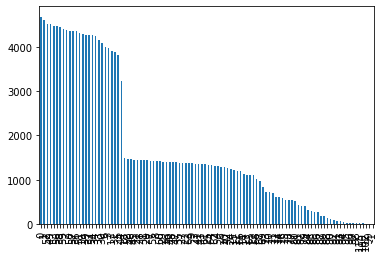

In [28]:
import matplotlib.pyplot as plt
df['AppointmentDay'].value_counts().plot(kind = 'bar')
df['Age'].value_counts().plot(kind = 'bar')

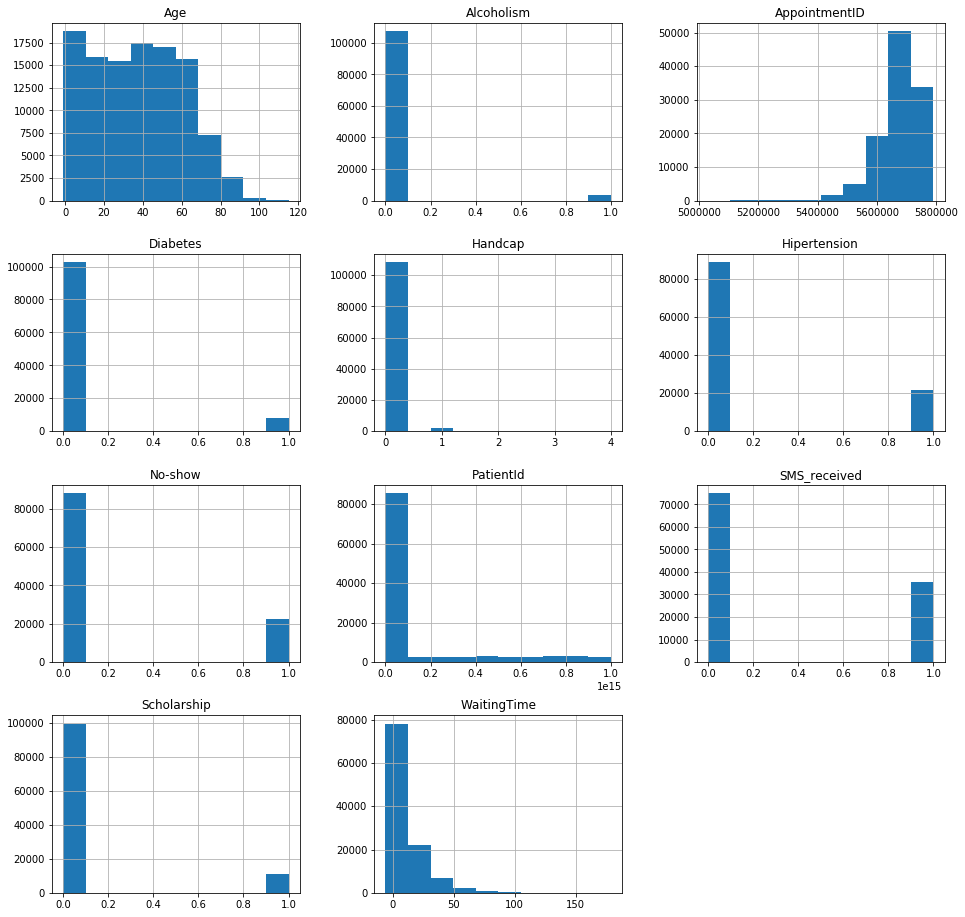

In [22]:
df.hist(figsize=(16,16));

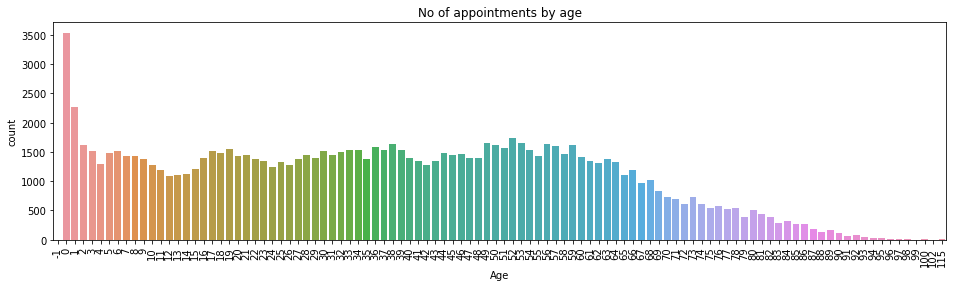

In [29]:
import seaborn as sns
plt.figure(figsize=(16,4))
plt.xticks(rotation=90)
ax = sns.countplot(x=df['Age'])
ax.set_title("No of appointments by age")
plt.show()

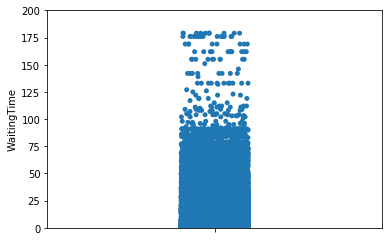

In [30]:
sns.stripplot(data = df, y = 'WaitingTime', jitter = True)
plt.ylim(0, 200)
plt.show();

In [31]:
#df.insert(2, 'new-col', data)
print(df['WaitingTime'].unique())
print("Number of Unique Waiting Time = ",df['WaitingTime'].nunique())


#print(value_counts().(df.WaitingTime.unique()))

[  0   2   3   1   4   9  29  10  23  11  18  17  14  28  24  21  15  16
  22  43  30  31  42  32  56  45  46  39  37  38  44  50  60  52  53  65
  67  91  66  84  78  87 115 109  63  70  72  57  58  51  59  41  49  73
  64  20  33  34   6  35  36  12  13  40  47   8   5   7  25  26  48  27
  19  61  55  62 176  54  77  69  83  76  89  81 103  79  68  75  85 112
  -1  80  86  98  94 142 155 162 169 104 133 125  96  88  90 151 126 127
 111 119  74  71  82 108 110 102 122 101 105  92  97  93 107  95  -6 139
 132 179 117 146 123]
Number of Unique Waiting Time =  131


In [32]:
print('Before change: {}'.format(df[(df.WaitingTime < 0)].WaitingTime.value_counts()))

Before change: -1    4
-6    1
Name: WaitingTime, dtype: int64


In [33]:
df = df[(df.WaitingTime >= 0)]

#Check if any awaiting time days values below 0 left in the dataset
print('After change: {}'.format(df[(df.WaitingTime < 0)].WaitingTime.value_counts()))

After change: Series([], Name: WaitingTime, dtype: int64)


In [43]:
df.columns = ['PatientId', 'AppointmentID', 'Gender', 'ScheduledDay',
       'AppointmentDay', 'Age', 'Neighbourhood', 'Scholarship', 'Hipertension',
       'Diabetes', 'Alcoholism', 'Handcap', 'SMS_received', 'No_Show',
       'WaitingTime']

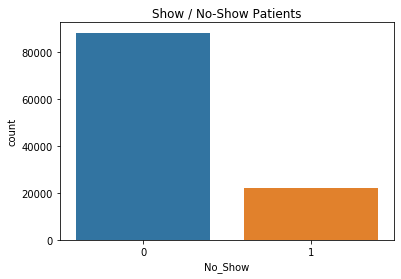

20% of appointments were missed.


In [46]:
all_appointments = df.shape[0]
missed_appointments = len(df.query('No_Show == 1'))
missed_ratio = int(round(missed_appointments/all_appointments*100))

ax = sns.countplot(x=df.No_Show, data=df)
ax.set_title("Show / No-Show Patients")
plt.show();

print('{}% of appointments were missed.'.format(missed_ratio))

In [47]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 110522 entries, 0 to 110526
Data columns (total 15 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   PatientId       110522 non-null  float64       
 1   AppointmentID   110522 non-null  int64         
 2   Gender          110522 non-null  object        
 3   ScheduledDay    110522 non-null  datetime64[ns]
 4   AppointmentDay  110522 non-null  datetime64[ns]
 5   Age             110522 non-null  int64         
 6   Neighbourhood   110522 non-null  object        
 7   Scholarship     110522 non-null  int64         
 8   Hipertension    110522 non-null  int64         
 9   Diabetes        110522 non-null  int64         
 10  Alcoholism      110522 non-null  int64         
 11  Handcap         110522 non-null  int64         
 12  SMS_received    110522 non-null  int64         
 13  No_Show         110522 non-null  int64         
 14  WaitingTime     110522 non-null  int

In [48]:
df.rename({'No-show': 'No_Show','Handcap':'Handicap','Hipertension':'Hypertension'}, axis=1, inplace=True)
#df.describe()
df

/home/greymatters/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hypertension,Diabetes,Alcoholism,Handicap,SMS_received,No_Show,WaitingTime
0,2.987250e+13,5642903,F,2016-04-29,2016-04-29,62,JARDIM DA PENHA,0,1,0,0,0,0,0,0
1,5.589978e+14,5642503,M,2016-04-29,2016-04-29,56,JARDIM DA PENHA,0,0,0,0,0,0,0,0
2,4.262962e+12,5642549,F,2016-04-29,2016-04-29,62,MATA DA PRAIA,0,0,0,0,0,0,0,0
3,8.679512e+11,5642828,F,2016-04-29,2016-04-29,8,PONTAL DE CAMBURI,0,0,0,0,0,0,0,0
4,8.841186e+12,5642494,F,2016-04-29,2016-04-29,56,JARDIM DA PENHA,0,1,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110522,2.572134e+12,5651768,F,2016-05-03,2016-06-07,56,MARIA ORTIZ,0,0,0,0,0,1,0,35
110523,3.596266e+12,5650093,F,2016-05-03,2016-06-07,51,MARIA ORTIZ,0,0,0,0,0,1,0,35
110524,1.557663e+13,5630692,F,2016-04-27,2016-06-07,21,MARIA ORTIZ,0,0,0,0,0,1,0,41
110525,9.213493e+13,5630323,F,2016-04-27,2016-06-07,38,MARIA ORTIZ,0,0,0,0,0,1,0,41


In [49]:
df.describe()

,PatientId,AppointmentID,Age,Scholarship,Hypertension,Diabetes,Alcoholism,Handicap,SMS_received,No_Show,WaitingTime
count,1.105220e+05,1.105220e+05,110522.000000,110522.000000,110522.000000,110522.000000,110522.000000,110522.000000,110522.000000,110522.000000,110522.000000
mean,1.474935e+14,5.675305e+06,37.089041,0.098270,0.197255,0.071868,0.030401,0.022231,0.321040,0.201896,10.184253
std,2.560866e+14,7.129722e+04,23.110064,0.297681,0.397928,0.258270,0.171689,0.161493,0.466878,0.401417,15.255115
min,3.921784e+04,5.030230e+06,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.172536e+12,5.640284e+06,18.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,3.173700e+13,5.680574e+06,37.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000
75%,9.439277e+13,5.725525e+06,55.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,15.000000
max,9.999816e+14,5.790484e+06,115.000000,1.000000,1.000000,1.000000,1.000000,4.000000,1.000000,1.000000,179.000000


In [50]:
df

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hypertension,Diabetes,Alcoholism,Handicap,SMS_received,No_Show,WaitingTime
0,2.987250e+13,5642903,F,2016-04-29,2016-04-29,62,JARDIM DA PENHA,0,1,0,0,0,0,0,0
1,5.589978e+14,5642503,M,2016-04-29,2016-04-29,56,JARDIM DA PENHA,0,0,0,0,0,0,0,0
2,4.262962e+12,5642549,F,2016-04-29,2016-04-29,62,MATA DA PRAIA,0,0,0,0,0,0,0,0
3,8.679512e+11,5642828,F,2016-04-29,2016-04-29,8,PONTAL DE CAMBURI,0,0,0,0,0,0,0,0
4,8.841186e+12,5642494,F,2016-04-29,2016-04-29,56,JARDIM DA PENHA,0,1,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110522,2.572134e+12,5651768,F,2016-05-03,2016-06-07,56,MARIA ORTIZ,0,0,0,0,0,1,0,35
110523,3.596266e+12,5650093,F,2016-05-03,2016-06-07,51,MARIA ORTIZ,0,0,0,0,0,1,0,35
110524,1.557663e+13,5630692,F,2016-04-27,2016-06-07,21,MARIA ORTIZ,0,0,0,0,0,1,0,41
110525,9.213493e+13,5630323,F,2016-04-27,2016-06-07,38,MARIA ORTIZ,0,0,0,0,0,1,0,41


In [52]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pydotplus
from sklearn import metrics
%matplotlib inline

In [53]:
df.Gender[df.Gender == 'M'] = 0
df.Gender[df.Gender == 'F'] = 1

/home/greymatters/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/home/greymatters/anaconda3/lib/python3.7/site-packages/pandas/core/generic.py:8767: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(new_data)
/home/greymatters/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returnin

In [67]:
df.AppointmentDay[df.AppointmentDay == 'Monday'] = 0
df.AppointmentDay[df.AppointmentDay == 'Tuesday'] = 1
df.AppointmentDay[df.AppointmentDay == 'Wednesday'] = 2
df.AppointmentDay[df.AppointmentDay == 'Thursday'] = 3
df.AppointmentDay[df.AppointmentDay == 'Friday'] = 4
df.AppointmentDay[df.AppointmentDay == 'Saturday'] = 5
df.AppointmentDay[df.AppointmentDay == 'Sunday'] = 6

/home/greymatters/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/home/greymatters/anaconda3/lib/python3.7/site-packages/pandas/core/generic.py:8767: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(new_data)
/home/greymatters/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returnin

In [68]:
df.head()

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hypertension,Diabetes,Alcoholism,Handicap,SMS_received,No_Show,WaitingTime
0,2.987250e+13,5642903,1,2016-04-29,2016-04-29,62,39,0,1,0,0,0,0,0,0
1,5.589978e+14,5642503,0,2016-04-29,2016-04-29,56,39,0,0,0,0,0,0,0,0
2,4.262962e+12,5642549,1,2016-04-29,2016-04-29,62,45,0,0,0,0,0,0,0,0
3,8.679512e+11,5642828,1,2016-04-29,2016-04-29,8,54,0,0,0,0,0,0,0,0
4,8.841186e+12,5642494,1,2016-04-29,2016-04-29,56,39,0,1,1,0,0,0,0,0


In [69]:
df['Neighbourhood'].value_counts()

38    7717
43    5805
59    4430
39    3877
36    3514
      ... 
31      35
32      10
0        8
34       2
51       1
Name: Neighbourhood, Length: 81, dtype: int64

In [70]:
df['Neighbourhood'].unique()

array([39, 45, 54, 58, 25,  1, 12, 50, 15, 78,  6, 77, 66, 75, 44, 26, 74,
       29, 68, 73,  8, 38, 43, 37,  2, 59, 30, 42, 46, 48, 69,  5, 56, 63,
       36, 35, 79, 76, 57, 62, 10, 52, 18, 70,  9,  3, 32, 27, 41, 13, 55,
        7, 47, 64, 65,  4, 21, 23, 22, 20, 71, 53, 40, 67, 14, 33, 60, 11,
       61, 80, 16, 19, 17, 28, 72, 31, 24, 49,  0, 34, 51])

In [71]:
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
df['Neighbourhood']= label_encoder.fit_transform(df['Neighbourhood']) 
df['Neighbourhood'].unique()

/home/greymatters/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


array([39, 45, 54, 58, 25,  1, 12, 50, 15, 78,  6, 77, 66, 75, 44, 26, 74,
       29, 68, 73,  8, 38, 43, 37,  2, 59, 30, 42, 46, 48, 69,  5, 56, 63,
       36, 35, 79, 76, 57, 62, 10, 52, 18, 70,  9,  3, 32, 27, 41, 13, 55,
        7, 47, 64, 65,  4, 21, 23, 22, 20, 71, 53, 40, 67, 14, 33, 60, 11,
       61, 80, 16, 19, 17, 28, 72, 31, 24, 49,  0, 34, 51])

In [72]:
df.head()

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hypertension,Diabetes,Alcoholism,Handicap,SMS_received,No_Show,WaitingTime
0,2.987250e+13,5642903,1,2016-04-29,2016-04-29,62,39,0,1,0,0,0,0,0,0
1,5.589978e+14,5642503,0,2016-04-29,2016-04-29,56,39,0,0,0,0,0,0,0,0
2,4.262962e+12,5642549,1,2016-04-29,2016-04-29,62,45,0,0,0,0,0,0,0,0
3,8.679512e+11,5642828,1,2016-04-29,2016-04-29,8,54,0,0,0,0,0,0,0,0
4,8.841186e+12,5642494,1,2016-04-29,2016-04-29,56,39,0,1,1,0,0,0,0,0


In [73]:
df = df.drop(['ScheduledDay','AppointmentDay'],axis=1)

In [74]:
cols = df.columns.tolist()
cols = cols[:11] + cols[12:] + cols[11:12]
cols
df = df[cols]
df.head()


,PatientId,AppointmentID,Gender,Age,Neighbourhood,Scholarship,Hypertension,Diabetes,Alcoholism,Handicap,SMS_received,WaitingTime,No_Show
0,2.987250e+13,5642903,1,62,39,0,1,0,0,0,0,0,0
1,5.589978e+14,5642503,0,56,39,0,0,0,0,0,0,0,0
2,4.262962e+12,5642549,1,62,45,0,0,0,0,0,0,0,0
3,8.679512e+11,5642828,1,8,54,0,0,0,0,0,0,0,0
4,8.841186e+12,5642494,1,56,39,0,1,1,0,0,0,0,0


In [75]:
df

,PatientId,AppointmentID,Gender,Age,Neighbourhood,Scholarship,Hypertension,Diabetes,Alcoholism,Handicap,SMS_received,WaitingTime,No_Show
0,2.987250e+13,5642903,1,62,39,0,1,0,0,0,0,0,0
1,5.589978e+14,5642503,0,56,39,0,0,0,0,0,0,0,0
2,4.262962e+12,5642549,1,62,45,0,0,0,0,0,0,0,0
3,8.679512e+11,5642828,1,8,54,0,0,0,0,0,0,0,0
4,8.841186e+12,5642494,1,56,39,0,1,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
110522,2.572134e+12,5651768,1,56,43,0,0,0,0,0,1,35,0
110523,3.596266e+12,5650093,1,51,43,0,0,0,0,0,1,35,0
110524,1.557663e+13,5630692,1,21,43,0,0,0,0,0,1,41,0
110525,9.213493e+13,5630323,1,38,43,0,0,0,0,0,1,41,0


RuntimeError: Selected KDE bandwidth is 0. Cannot estiamte density.

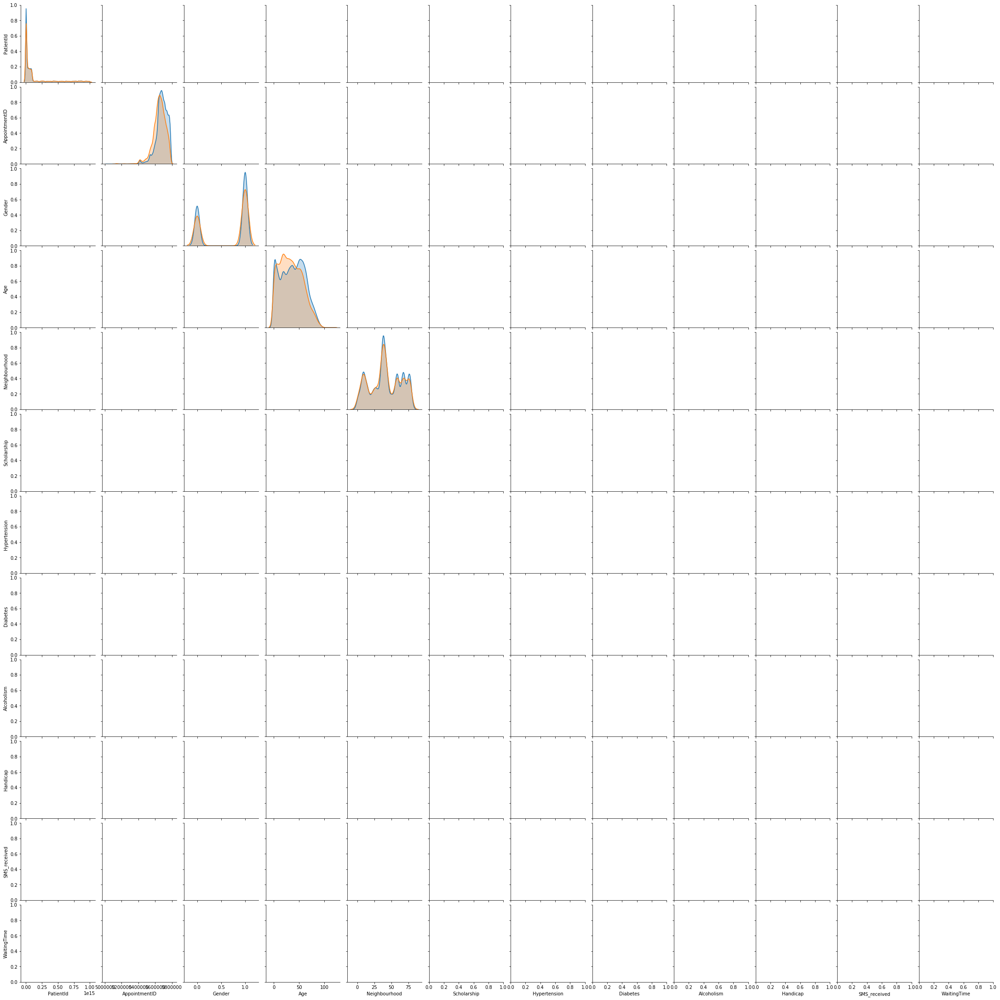

In [77]:
sns.pairplot(df,hue='No_Show')

In [78]:
from sklearn.model_selection import train_test_split

In [79]:
X = df.drop('No_Show',axis=1)
y = df['No_Show']

In [80]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30)

In [81]:
from sklearn.tree import DecisionTreeClassifier

In [82]:
dtree = DecisionTreeClassifier()

In [83]:
dtree.fit(X_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [84]:
predictions = dtree.predict(X_test)

In [85]:
from sklearn.metrics import classification_report,confusion_matrix

In [86]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.83      0.82      0.82     26504
           1       0.32      0.34      0.33      6653

    accuracy                           0.72     33157
   macro avg       0.58      0.58      0.58     33157
weighted avg       0.73      0.72      0.73     33157



In [87]:
print(confusion_matrix(y_test,predictions))

[[21661  4843]
 [ 4361  2292]]


In [88]:
# Tree visualization
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydot 

features2 = list(df.columns[:-1])

features3 = list(df.columns[:-1])
features = features3
#features = list(df.columns[:-1])
#features

/home/greymatters/anaconda3/lib/python3.7/site-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


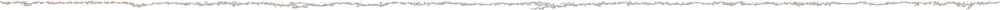

In [89]:
dot_data = StringIO()
export_graphviz(dtree, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydot.graph_from_dot_data(dot_data.getvalue())
Image(graph[0].create_png())

In [90]:
cat_features_for_encoding = ['Handicap', 'Neighbourhood']


encoded_df = pd.get_dummies(df, columns=cat_features_for_encoding)
print ("New encoded dataframe has {} rows and {} features.".format(encoded_df.shape[0], encoded_df.shape[1]))

# Increasing the max column shown for this cell to 100
#pd.set_option("max_columns", 100)

encoded_df.head()
labels = encoded_df['No_Show']
features_train, features_test, labels_train, labels_test = train_test_split(df, labels, test_size=0.3, random_state=60)

New encoded dataframe has 110522 rows and 97 features.


In [91]:
features = encoded_df.drop(['No_Show', 'PatientId', 'AppointmentID'], axis=1)

# labels refers to "No-show" as they are the classes to predict
labels = encoded_df['No_Show']
print (labels.head())
features.head()

0    0
1    0
2    0
3    0
4    0
Name: No_Show, dtype: int64


,Gender,Age,Scholarship,Hypertension,Diabetes,Alcoholism,SMS_received,WaitingTime,Handicap_0,Handicap_1,...,Neighbourhood_71,Neighbourhood_72,Neighbourhood_73,Neighbourhood_74,Neighbourhood_75,Neighbourhood_76,Neighbourhood_77,Neighbourhood_78,Neighbourhood_79,Neighbourhood_80
0,1,62,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,0,56,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2,1,62,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,1,8,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,1,56,0,1,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [92]:
features_train, features_test, labels_train, labels_test = \
    train_test_split(features, labels, test_size=0.3, random_state=60)


In [93]:
cv = StratifiedShuffleSplit(n_splits=15, test_size=0.2, random_state=60)

In [94]:
clf = tree.DecisionTreeClassifier(random_state=60)
clf.fit(features_train, labels_train)

# Feature Importances to see whether new feature created has any importance.
importances = clf.feature_importances_
indices = np.argsort(importances)[::-1]

print ("Feature ranking: ")
for i in range(1, 11, 1):
    print ("  {}.  feature: {} ({})".format(i, features_train.columns[i], importances[indices[i]]))

Feature ranking: 
  1.  feature: Age (0.2719677013934055)
  2.  feature: Scholarship (0.03779577284772343)
  3.  feature: Hypertension (0.0238192939788362)
  4.  feature: Diabetes (0.02085328153882376)
  5.  feature: Alcoholism (0.020209785511883623)
  6.  feature: SMS_received (0.011012965046495828)
  7.  feature: WaitingTime (0.009801358438539201)
  8.  feature: Handicap_0 (0.0090809133010739)
  9.  feature: Handicap_1 (0.00870826264009459)
  10.  feature: Handicap_2 (0.008509902099574402)


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.070054 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.070054 to fit



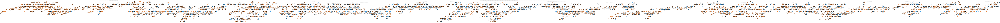

In [95]:
fname = features.columns.values
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,filled=True, rounded=True,special_characters=True,feature_names = fname)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('no_show.png')
Image(graph.create_png())

In [96]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy", max_depth=3)

# Train Decision Tree Classifer
clf = clf.fit(features_train,labels_train)

#Predict the response for test dataset
y_pred = clf.predict(features_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(labels_test, y_pred))

Accuracy: 0.7980818530023827


In [97]:
max_depth_range = list(range(1, 10))
# List to store the average RMSE for each value of max_depth:
accuracy = []
for depth in max_depth_range:
    
    clf = DecisionTreeClassifier(max_depth = depth, 
                             random_state = 0)
    clf.fit(features_train, labels_train)
    score = clf.score(features_test, labels_test)
    accuracy.append(score)

In [98]:
accuracy

[0.7980818530023827,
 0.7980818530023827,
 0.7980818530023827,
 0.7980818530023827,
 0.7978707361944687,
 0.7982024911783334,
 0.7979612148264318,
 0.7970865880507887,
 0.7960008444672316]

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.676501 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.676501 to fit



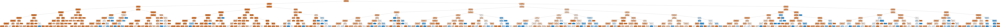

In [99]:
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,filled=True, rounded=True,special_characters=True,feature_names = fname)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('no_show.png')
Image(graph.create_png())